In [1]:

import matplotlib.pyplot as plt
import pandas as pd
import time

from alphabt import *


# 作多

In [2]:

Data.datasource = 'yfapi'
data = Data().get_data(ticker='T', startdate='2000', enddate='2020')

(5284, 6)

# 回測策略:
  * 5MA、25MA 黃金交叉 以及 成交量大於20MA成交量
  * 5MA、25MA 死叉

### 單純作多

In [3]:


class _250MA(Strategy):
    
    def __init__(self):
        self.data = data
        self.init_capital = 1000000
        self.vol_20 = self.data.volume.rolling(20).mean().values
        self.ma25 = self.indicator('MA', 25)['MA'].values
        self.ma5 = self.indicator('MA', 5)['MA'].values

        
    def signal(self, i):
        
        buy_con = (self.ma25[i - 1] > self.ma5[i - 1]) & (self.ma25[i] < self.ma5[i]) & (self.data.volume[i] >= self.vol_20[i])
                   
        sell_con = (self.ma25[i - 1] < self.ma5[i - 1]) & (self.ma25[i] > self.ma5[i])
        
        if (buy_con) & ( self.empty_position):

            self.buy()
            
        if (sell_con) & (self.long_position):

            self.close_position()
        
    
    



In [5]:
%%time
bt = Backtest(_250MA(), commission=None).run()
log, per = bt.get_report()

-----------------------------|
sharpe ratio | -0.33 --------|
-----------------------------|
calmar ratio | -0.232 --------|
-----------------------------|
CPU times: user 883 ms, sys: 8.47 ms, total: 892 ms
Wall time: 892 ms


In [6]:
print(log.shape)
log.head()

(72, 16)


,BuyDate,BuyPrice,BuyUnits,CashPaying,SellDate,SellPrice,SellUnits,CashReceiving,KeepDay,profit(元),報酬率(%),累積報酬率(%),MDD(%),Equity,EquityReturn,EquityAccumulateReturn
0,2000-04-06,46.06,21710,999962.60,2000-04-19,41.44,-21710,899662.40,13,-100300.20,-10.030,-10.030,12.169,899699.80,-10.030020,-10.030
1,2000-05-02,44.50,20217,899656.50,2000-05-03,42.31,-20217,855381.27,1,-44275.23,-4.921,-14.457,1.038,855424.57,-4.921111,-14.458
2,2000-06-05,45.31,18879,855407.49,2000-07-03,44.12,-18879,832941.48,28,-22466.01,-2.626,-16.704,12.000,832958.56,-2.626299,-16.704
3,2001-02-26,49.72,16752,832909.44,2001-03-05,46.10,-16752,772267.20,7,-60642.24,-7.281,-22.769,10.221,772316.32,-7.280343,-22.768
4,2001-07-12,41.85,18454,772299.90,2001-08-21,43.95,-18454,811053.30,40,38753.40,5.018,-18.893,7.328,811069.72,5.017814,-18.893


In [7]:
per

,年度總損益(元),作多次數(次),作空次數(次),交易總次數(次),勝率(%),獲利因子,最大損失(元),最大獲利(元),個股年度報酬(%),當年度報酬率(%),平均交易報酬率(%),累積年度報酬(%),當年度權益報酬率(%),權益累積年度報酬(%),權益,年化報酬率(%),權益年化報酬率(%),大盤年化報酬率(%)
2000,-167041.44,3,0,3,0.00,0.000000e+00,-100300.0,0.0,-1.67,-16.70,-5.57,-16.70,-16.70,-16.70,832959,-16.70,-16.70,-9.27
2001,-61195.90,3,0,3,33.33,3.880000e-01,-60642.0,38753.0,-17.64,-7.35,-2.45,-22.82,-7.35,-22.82,771763,-12.15,-12.15,-11.18
2002,-86448.88,2,0,2,0.00,0.000000e+00,-45546.0,0.0,-30.93,-11.20,-5.60,-31.47,-11.20,-31.47,685314,-11.84,-11.84,-15.44
2003,-40107.90,4,0,4,25.00,8.300000e-02,-26708.0,3636.0,-6.56,-5.85,-1.46,-35.48,-5.85,-35.48,645206,-10.38,-10.38,-6.51
2004,-70036.00,6,0,6,33.33,4.210000e-01,-54987.0,33971.0,-1.15,-10.85,-1.81,-42.48,-10.85,-42.48,575170,-10.47,-10.47,-3.59
2005,-52430.35,8,0,8,0.00,0.000000e+00,-22932.0,0.0,-5.74,-9.12,-1.14,-47.73,-9.12,-47.73,522740,-10.25,-10.25,-2.52
2006,99982.18,4,0,4,75.00,1.160500e+01,-9428.0,77203.0,45.98,19.13,4.78,-37.73,19.13,-37.73,622722,-6.54,-6.54,-0.37
2007,1751.52,3,0,3,33.33,1.065000e+00,-21000.0,28583.0,16.51,0.28,0.09,-37.55,0.28,-37.55,624473,-5.72,-5.72,0.11
2008,-84457.61,4,0,4,25.00,1.250000e-01,-44559.0,12038.0,-31.34,-13.52,-3.38,-46.00,-13.52,-46.00,540016,-6.62,-6.62,-5.16
2009,-22841.99,4,0,4,50.00,2.820000e-01,-24249.0,7847.0,-2.47,-4.23,-1.06,-48.28,-4.23,-48.28,517174,-6.38,-6.38,-2.63


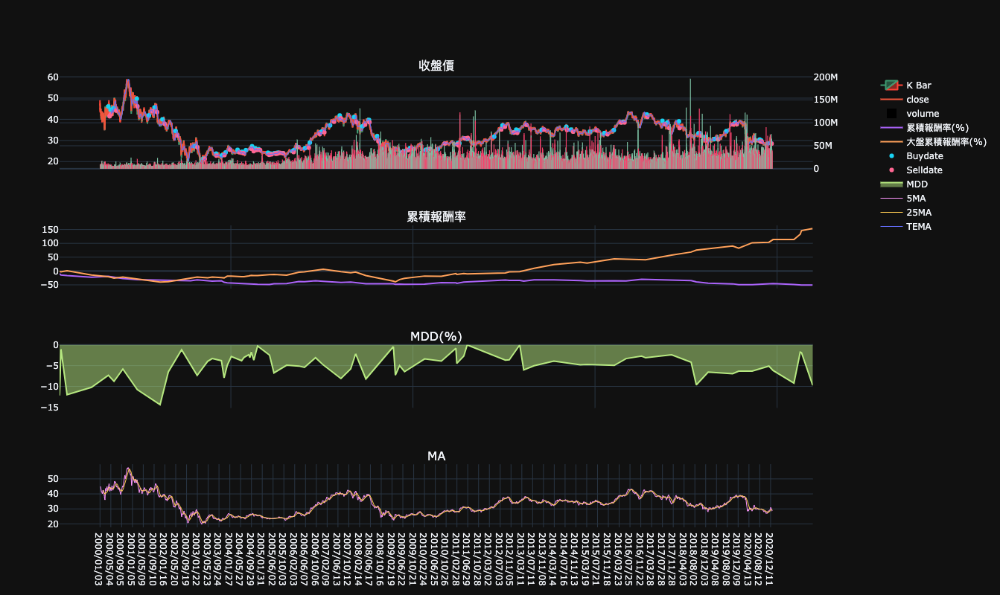

In [8]:
Backtest(_250MA).get_plot(subplot_technical_index=['MA'], overlap=['TEMA'], sub_plot_param={'MA':[5, 25]}, overlap_param=None, log=log)


# 回測策略:
  * 前一天收盤價大於5ma
  * 5MA、25MA 死叉

### 作多 + 加倉

In [21]:
%%time
class _250MA2(Strategy):
    
    def __init__(self):
        self.data = data
        self.init_capital = 1000000
        self.vol_20 = self.data.volume.rolling(20).mean().values
        self.ma25 = self.indicator('MA', 25)['MA'].values
        self.ma5 = self.indicator('MA', 5)['MA'].values

        
    def signal(self, i):
        
        buy_con = (self.data.close.values[i - 1] > self.ma5[i - 1]) #& (self.ma25[i] < self.ma5[i]) & (self.data.volume[i] >= self.vol_20[i])
                   
        sell_con = (self.ma25[i - 1] < self.ma5[i - 1]) & (self.ma25[i] > self.ma5[i])
        
        if (buy_con) :

            self.buy(stop_loss=0.1)
            
        if (sell_con):
          
            self.close_position()
        
bt = Backtest(_250MA2, commission=None).run()
log2, per2 = bt.get_report()

-----------------------------|
sharpe ratio | -0.299 --------|
-----------------------------|
calmar ratio | -0.216 --------|
-----------------------------|
CPU times: user 1.61 s, sys: 9.67 ms, total: 1.62 s
Wall time: 1.61 s


In [22]:
print(log2.shape)
log2.head(10)

(175, 16)


,BuyDate,BuyPrice,BuyUnits,CashPaying,SellDate,SellPrice,SellUnits,CashReceiving,KeepDay,profit(元),報酬率(%),累積報酬率(%),MDD(%),Equity,EquityReturn,EquityAccumulateReturn
0,2000-01-12,43.50,22988,999978.00,2000-01-27,39.150,-22988,899980.200,15,-99997.800,-10.000,-10.000,9.302,900002.200,-9.999780,-10.000
1,2000-02-02,43.00,20930,899990.00,2000-02-15,40.000,-20930,837200.000,13,-62790.000,-6.977,-16.279,5.115,837212.200,-6.976650,-16.279
2,2000-03-01,40.06,20898,837173.88,2000-04-03,42.500,-20898,888165.000,33,50991.120,6.091,-11.180,9.027,888203.320,6.090585,-11.180
3,2000-04-05,46.00,19308,888168.00,2000-04-19,41.440,-19308,800123.520,14,-88044.480,-9.913,-19.985,12.169,800158.840,-9.912649,-19.984
4,2000-04-26,45.00,17781,800145.00,2000-05-03,42.310,-17781,752314.110,7,-47830.890,-5.978,-24.768,6.006,752327.950,-5.977674,-24.767
5,2000-05-09,42.38,17751,752287.38,2000-05-24,42.060,-17751,746607.060,15,-5680.320,-0.755,-25.336,9.109,746647.630,-0.755032,-25.335
6,2000-05-26,42.06,17751,746607.06,2000-07-03,44.120,-17751,783174.120,38,36567.060,4.898,-21.679,12.000,783214.690,4.897499,-21.679
7,2000-07-06,45.56,17190,783176.40,2000-08-09,42.690,-17190,733841.100,34,-49335.300,-6.299,-26.612,8.874,733879.390,-6.299077,-26.612
8,2000-08-25,40.75,18009,733866.75,2000-11-29,54.880,-18009,988333.920,96,254467.170,34.675,-1.165,7.590,988346.560,34.674249,-1.165
9,2000-12-08,54.12,18262,988339.44,2000-12-20,48.708,-18262,889505.496,12,-98833.944,-10.000,-11.049,19.334,889512.616,-9.999928,-11.049


In [23]:
per2

,年度總損益(元),作多次數(次),作空次數(次),交易總次數(次),勝率(%),獲利因子,最大損失(元),最大獲利(元),個股年度報酬(%),當年度報酬率(%),平均交易報酬率(%),累積年度報酬(%),當年度權益報酬率(%),權益累積年度報酬(%),權益,年化報酬率(%),權益年化報酬率(%),大盤年化報酬率(%)
2000,-110487.38,10,0,10,30.00,0.756,-99998.0,254467.0,-1.67,-11.05,-1.10,-11.05,-11.05,-11.05,889513,-11.05,-11.05,-9.27
2001,-55392.07,7,0,7,42.86,0.556,-61330.0,43258.0,-17.64,-6.23,-0.89,-16.59,-6.23,-16.59,834121,-8.67,-8.67,-11.18
2002,-172368.48,9,0,9,22.22,0.428,-88586.0,75933.0,-30.93,-20.67,-2.30,-33.82,-20.66,-33.82,661752,-12.86,-12.86,-15.44
2003,-128982.27,10,0,10,20.00,0.506,-65295.0,116517.0,-6.56,-19.49,-1.95,-46.72,-19.49,-46.72,532770,-14.56,-14.56,-6.51
2004,21091.09,8,0,8,50.00,1.270,-38501.0,48124.0,-1.15,3.96,0.50,-44.61,3.96,-44.61,553861,-11.14,-11.14,-3.59
2005,-35012.33,14,0,14,14.29,0.366,-14820.0,14720.0,-5.74,-7.23,-0.52,-48.62,-6.32,-48.12,518849,-10.50,-10.36,-2.52
2006,103324.18,6,0,6,50.00,3.097,-24809.0,105353.0,45.98,19.92,3.32,-38.39,19.91,-37.78,622173,-6.69,-6.55,-0.37
2007,45715.27,9,0,9,66.67,1.469,-74206.0,45094.0,16.51,7.35,0.82,-33.86,7.35,-33.21,667888,-5.04,-4.92,0.11
2008,-179132.79,12,0,12,33.33,0.312,-64947.0,37657.0,-31.34,-26.41,-2.20,-51.33,-26.82,-51.12,488755,-7.69,-7.65,-5.16
2009,-48931.44,9,0,9,44.44,0.611,-46186.0,38223.0,-2.47,-10.01,-1.11,-56.20,-10.01,-56.02,439824,-7.92,-7.89,-2.63


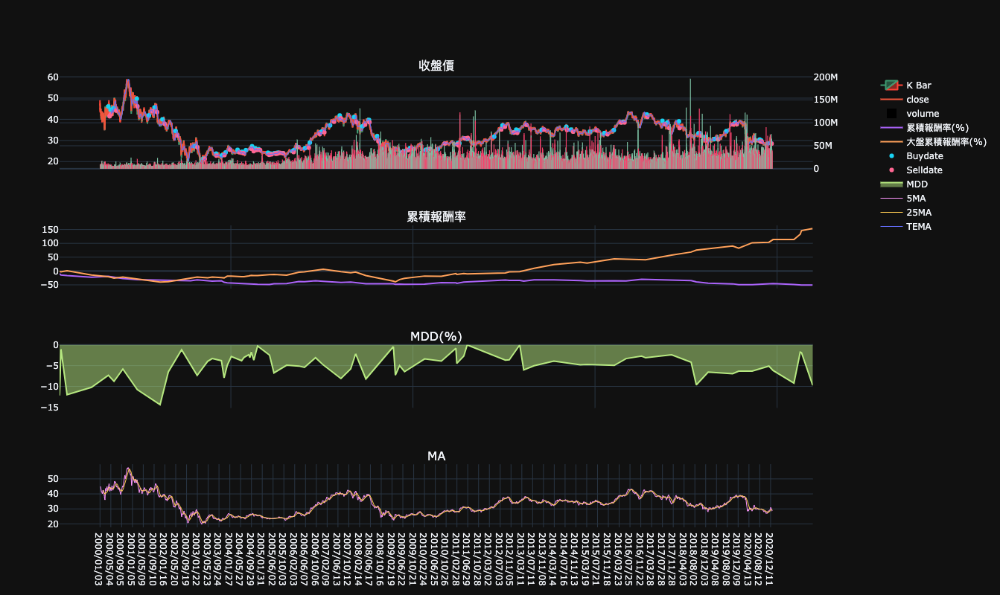

In [24]:
Bt(_250MA2).get_plot(subplot_technical_index=['MA'], overlap=['TEMA'], sub_plot_param={'MA':[5, 25]}, overlap_param=None, log=log)
